
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
    Fall 2024 - Prof. Sharifi Zarchi<br>
<font color=3C99D size=5>
    HW4 Practical <br>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Shabani


In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [2]:
!pip install pytorch_lightning
!pip install seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 25.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 51.8 MB/s eta 0:00:00


In [99]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

## Loading the Data

In [103]:
import os
import pandas as pd
from tqdm import tqdm


def load_data(PATH):
    filenames, outcomes = [], []

    for label in tqdm(os.listdir(PATH)):
        for file in os.listdir(PATH + "/" + label):
            filenames.append(PATH + "/" + label + "/" + file)
            outcomes.append(label2id[label])

    df = pd.DataFrame({
        'filename' : filenames,
        'outcome' : outcomes
    })

    return df.sample(frac = 1)

# TODO: Load the training, validation, and test data using the load_data function
TRAIN_PATH = '/content/drive/MyDrive/train'
VAL_PATH = '/content/drive/MyDrive/valid'
TEST_PATH = '/content/drive/MyDrive/test'

label2id, id2label = {}, {}

for i, label in enumerate(os.listdir(TRAIN_PATH)):
    label2id[label] = i

id2label = {value : key for (key, value) in label2id.items()}
df_train = load_data(TRAIN_PATH)
df_val = load_data(VAL_PATH)
df_test = load_data(TEST_PATH)

# TODO: Check the shape of the loaded DataFrames to verify correct data loading
df_train.shape, df_val.shape, df_test.shape

100%|██████████| 20/20 [00:00<00:00, 1925.58it/s]


((3208, 2), (100, 2), (100, 2))

In [104]:
# TODO: Combine the training and test data into a single DataFrame along th0e vertical axis
df_train = pd.concat([df_train, df_test], axis = 0).reset_index(drop=True)
df_train = df_train.sample(frac = 1)
df_train.shape

(3308, 2)

In [105]:
# TODO: Explore the new DataFrame
df_train.head(10)

,filename,outcome
2115,/content/drive/MyDrive/train/ALBERTS TOWHEE/00...,9
1715,/content/drive/MyDrive/train/ALEXANDRINE PARAK...,5
1609,/content/drive/MyDrive/train/AMERICAN GOLDFINC...,7
2489,/content/drive/MyDrive/train/AMERICAN BITTERN/...,0
2883,/content/drive/MyDrive/train/AMERICAN COOT/036...,8
3220,/content/drive/MyDrive/test/AMERICAN COOT/4.jpg,8
1750,/content/drive/MyDrive/train/AFRICAN PYGMY GOO...,10
2301,/content/drive/MyDrive/train/AMERICAN KESTREL/...,1
1326,/content/drive/MyDrive/train/AMERICAN BITTERN/...,0
646,/content/drive/MyDrive/train/ALEXANDRINE PARAK...,5


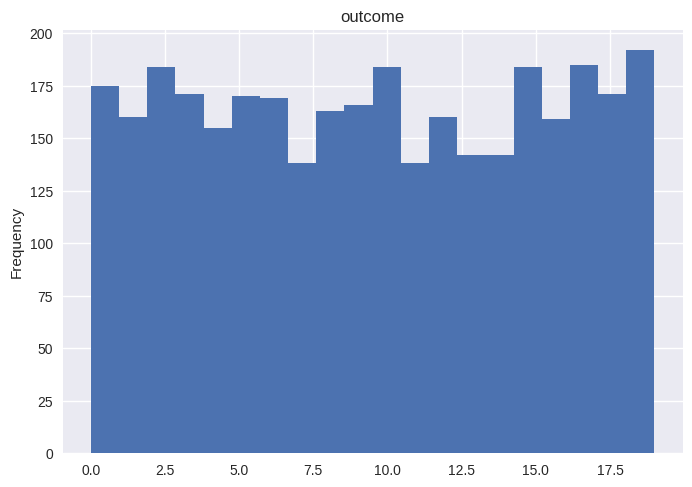

In [9]:
# @title outcome

from matplotlib import pyplot as plt
df_train['outcome'].plot(kind='hist', bins=20, title='outcome')
plt.gca().spines[['top', 'right',]].set_visible(False)

## Plot some of the images

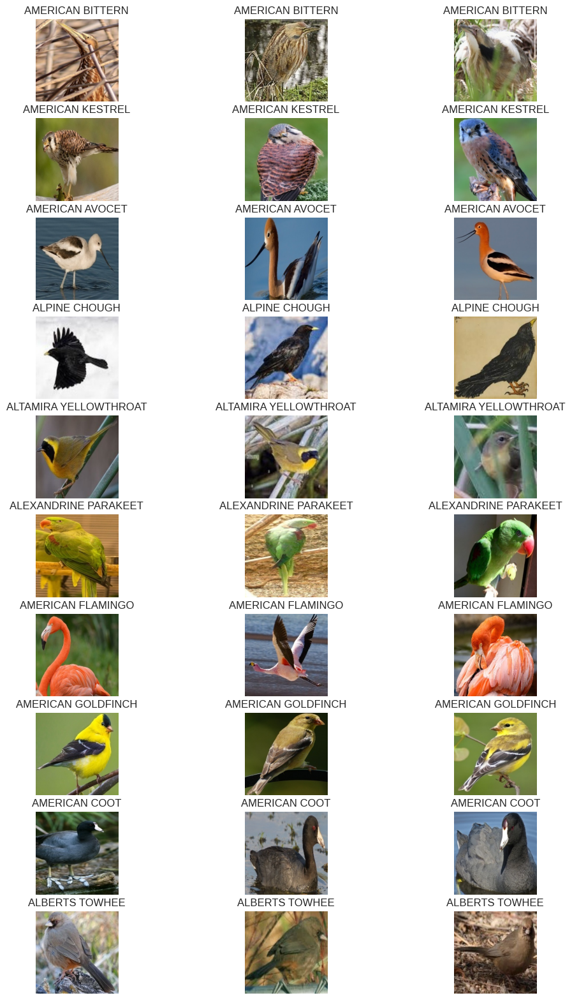

In [106]:
# TODO: Plot some of images
plt.figure(figsize = (12, 40))
counter = 0

for i in range(10):
    df = df_train[df_train['outcome'] == i].sample(n = 3)
    for img in df['filename']:
        plt.subplot(20, 3, counter + 1)
        img2 = plt.imread(img)
        plt.imshow(img2)
        plt.title(id2label[i])
        plt.axis('off')
        counter += 1

plt.show()

## Dataset Distribution
plot the distribution of the dataset, both training and validation set

<Axes: title={'center': 'Validation data'}, xlabel='outcome', ylabel='count'>

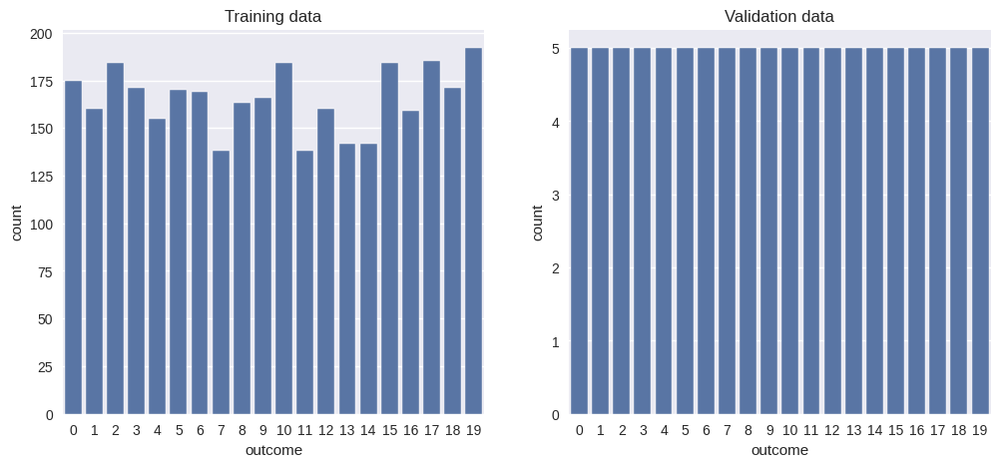

In [107]:
# TODO: Plot the distribution of classes
plt.figure(figsize = (12, 5))
plt.subplot(1,2, 1)
plt.title('Training data')
sea.countplot(x = 'outcome', data = df_train)

plt.subplot(1,2, 2)
plt.title('Validation data')
sea.countplot(x = 'outcome', data = df_val)

## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [108]:
class BirdDataset(Dataset):
    def __init__(self, df, transform_input=None, transform_target=None):
        self.df = df
        self.transform_input = transform_input  # Transform for grayscale input
        self.transform_target = transform_target  # Transform for RGB target

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # Load image using plt.imread (returns a numpy array)
        img = plt.imread(self.df.iloc[idx]['filename'])

        # Convert to grayscale (input) and RGB (target)
        grayscale_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  # Grayscale input
        rgb_img = img  # Original RGB image as target

        # Convert to PIL Image
        grayscale_img = Image.fromarray(grayscale_img)
        rgb_img = Image.fromarray(rgb_img)

        # Apply transformations
        if self.transform_input:
            grayscale_img = self.transform_input(grayscale_img)
        if self.transform_target:
            rgb_img = self.transform_target(rgb_img)

        return grayscale_img, rgb_img

transform_input = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ToTensor()  # Convert to tensor
    # transforms.Normalize(mean=[0.5], std=[0.5])
])

# Transformations for RGB target
transform_target = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor() # Convert to tensor
    # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize for 3 channels
])

# Create datasets
train_dataset = BirdDataset(df_train, transform_input=transform_input, transform_target=transform_target)
valid_dataset = BirdDataset(df_val, transform_input=transform_input, transform_target=transform_target)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=16, shuffle=False)

**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**

Data augmentation is crucial in training models for image tasks because it helps improve model generalization, combats overfitting, and increases the robustness of the model by exposing it to a broader variety of transformations that simulate real-world variations in data.
1.  Color Jitter
2. Random Cropping
3. Random Horizontal Flipping
4. Random Rotation
5. Normalization
6. Grayscale Conversion
7. Resize
8. Random Brightness and Saturation Changes


## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [109]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import models, transforms
from tqdm import tqdm

class PerceptualLoss(nn.Module):
    """
    This class calculates the perceptual loss by comparing features from different layers
    of a pre-trained VGG network. It uses L1 loss to calculate the difference between
    the feature maps of the input and target images.
    """
    def __init__(self, feature_layers=None, use_half=False):
        super(PerceptualLoss, self).__init__()
        vgg = models.vgg19(pretrained=True).features
        self.feature_layers = feature_layers or [0, 5, 10, 19, 28]
        self.vgg_layers = nn.ModuleList([vgg[i] for i in self.feature_layers])
        self.use_half = use_half
        if self.use_half:
            self.vgg_layers = self.vgg_layers.half()
        for param in self.vgg_layers.parameters():
            param.requires_grad = False

    def forward(self, input_image, target_image):
        if self.use_half:
            input_image = input_image.half()
            target_image = target_image.half()
        image_mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(input_image.device)
        image_std = torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(input_image.device)

        input_image = (input_image - image_mean) / image_std
        target_image = (target_image - image_mean) / image_std
        loss = 0
        for layer in self.vgg_layers:
            input_image = layer(input_image)
            target_image = layer(target_image)
            loss += F.l1_loss(input_image, target_image)

        return loss


class Encoder(nn.Module):
    """
    This class defines the encoder part of the model. It uses convolutional layers
    followed by fully connected layers to output the mean and log-variance of the latent space.
    """
    def __init__(self, do_bn=False, latent_dim=128):
        super(Encoder, self).__init__()
        self.do_bn = do_bn
        self.block1 = self.inner_block(1, 32)
        self.block2 = self.inner_block(32, 64)
        self.block3 = self.inner_block(64, 128)
        self.block4 = self.inner_block(128, 256)

        self.fc_mean_latent = nn.Linear(256*10*10, latent_dim)
        self.fc_log_variance_latent = nn.Linear(256*10*10, latent_dim)

    def inner_block(self, in_channels, out_channels, maxpool=2):
        """
        Inner block consisting of a convolution, batch normalization (optional),
        ReLU activation, and max pooling.
        """
        layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)]
        if self.do_bn:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.ReLU(inplace=True))
        layers.append(nn.MaxPool2d(kernel_size=maxpool, stride=maxpool))
        return nn.Sequential(*layers)

    def forward(self, input_image):
        """
        Forward pass through the encoder.
        """
        feature_map = self.block1(input_image)
        feature_map = self.block2(feature_map)
        feature_map = self.block3(feature_map)
        feature_map = self.block4(feature_map)
        feature_map = feature_map.view(feature_map.size(0), -1)
        mean_latent = self.fc_mean_latent(feature_map)
        log_variance_latent = self.fc_log_variance_latent(feature_map)

        return mean_latent, log_variance_latent


class Decoder(nn.Module):
    """
    This class defines the decoder part of the model. It takes the latent code,
    uses fully connected layers, and upscales the features to reconstruct the image.
    """
    def __init__(self, do_bn=False, latent_dim=128):
        super(Decoder, self).__init__()
        self.do_bn = do_bn
        self.fc = nn.Linear(latent_dim, 256*10*10)
        self.up1 = self.inner_block(256, 128)
        self.up2 = self.inner_block(128, 64)
        self.up3 = self.inner_block(64, 32)
        self.up4 = self.inner_block(32, 16)
        self.final_conv = nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1)

    def inner_block(self, in_channels, out_channels):
        """
        Inner block consisting of a transposed convolution, batch normalization (optional),
        and ReLU activation to upsample the feature maps.
        """
        layers = [nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)]
        if self.do_bn:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.ReLU(inplace=True))
        return nn.Sequential(*layers)

    def forward(self, latent_code):
        """
        Forward pass through the decoder.
        """
        feature_map = self.fc(latent_code)
        feature_map = feature_map.view(feature_map.size(0), 256, 10, 10)
        feature_map = self.up1(feature_map)
        feature_map = self.up2(feature_map)
        feature_map = self.up3(feature_map)
        feature_map = self.up4(feature_map)
        output_image = self.final_conv(feature_map)
        output_image = torch.sigmoid(output_image)
        return output_image


class Net(nn.Module):
    """
    This is the main model that combines the encoder, decoder, and loss functions.
    It also includes a reparameterization trick for Variational Autoencoders (VAE).
    """
    def __init__(self, latent_dim=128, lr=1e-4, do_bn=False, beta=1e-3):
        super(Net, self).__init__()
        self.encoder = Encoder(do_bn=do_bn, latent_dim=latent_dim)
        self.decoder = Decoder(do_bn=do_bn, latent_dim=latent_dim)
        # Uncomment to use perceptual loss i comment perceptual loss because lack of gpu and speed
        # self.ploss = PerceptualLoss()
        self.optim = torch.optim.Adam(self.parameters(), lr=lr)
        self.beta = beta

    def reparameterize(self, mean_latent, log_variance_latent):
        """
        Reparameterization trick for VAEs: sample from a normal distribution
        using the mean and log-variance.
        """
        std = torch.exp(0.5 * log_variance_latent)
        eps = torch.randn_like(std)
        return mean_latent + eps * std

    def forward(self, input_image):
        """
        Forward pass through the entire network.
        """
        mean_latent, log_variance_latent = self.encoder(input_image)
        latent_code = self.reparameterize(mean_latent, log_variance_latent)
        reconstructed_image = self.decoder(latent_code)
        return reconstructed_image, mean_latent, log_variance_latent

    def compute_loss(self, reconstructed_image, target_image, mean_latent, log_variance_latent):
        """
        Compute the total loss, combining reconstruction loss and KL divergence loss.
        """
        reconstruction_loss = F.mse_loss(reconstructed_image, target_image)
        kl_divergence_loss = -0.5 * torch.mean(1 + log_variance_latent - mean_latent.pow(2) - log_variance_latent.exp())
        total_loss = reconstruction_loss + self.beta * kl_divergence_loss
        return total_loss, reconstruction_loss, kl_divergence_loss

    def training_step(self, input_batch):
        """
        Training step for one batch. It performs a forward pass, computes the loss,
        and updates the model parameters.
        """
        gray_image, rgb_image = input_batch
        device = next(self.parameters()).device
        gray_image, rgb_image = gray_image.to(device), rgb_image.to(device)

        reconstructed_image, mean_latent, log_variance_latent = self.forward(gray_image)
        total_loss, reconstruction_loss, kl_divergence_loss = self.compute_loss(reconstructed_image, rgb_image, mean_latent, log_variance_latent)

        self.optim.zero_grad()
        total_loss.backward()
        self.optim.step()

        return total_loss.item(), reconstruction_loss.item(), kl_divergence_loss.item()

    def validation_step(self, input_batch):
        """
        Validation step for one batch. It does not update the model's parameters.
        """
        with torch.no_grad():
            gray_image, rgb_image = input_batch
            device = next(self.parameters()).device
            gray_image, rgb_image = gray_image.to(device), rgb_image.to(device)

            reconstructed_image, mean_latent, log_variance_latent = self.forward(gray_image)
            total_loss, reconstruction_loss, kl_divergence_loss = self.compute_loss(reconstructed_image, rgb_image, mean_latent, log_variance_latent)

        return total_loss.item(), reconstruction_loss.item(), kl_divergence_loss.item()

    def train_model(self, train_loader, val_loader, epochs=20, device='cuda'):
        """
        Train the model for a specified number of epochs.
        """
        train_loss_history = []
        validation_loss_history = []
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(self.optim, mode='min', factor=0.1, patience=5, verbose=True)

        for epoch in range(epochs):
            self.train()
            train_loss_epoch = []
            for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} - Training"):
                train_loss_epoch.append(self.training_step(batch)[0])

            self.eval()
            validation_loss_epoch = []
            for batch in tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} - Validation"):
                validation_loss_epoch.append(self.validation_step(batch)[0])

            train_loss_avg = torch.tensor(train_loss_epoch).mean()
            validation_loss_avg = torch.tensor(validation_loss_epoch).mean()
            scheduler.step(validation_loss_avg)

            print(f'Epoch {epoch+1}/{epochs} - Train Loss: {train_loss_avg:.4f} - Valid Loss: {validation_loss_avg:.4f}')

            train_loss_history.append(train_loss_avg)
            validation_loss_history.append(validation_loss_avg)

        return train_loss_history, validation_loss_history
model = Net(latent_dim=256, lr=1e-3).to(device)
print(model)


Net(
  (encoder): Encoder(
    (block1): Sequential(
      (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block2): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block3): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block4): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (fc_mean_latent): Linear(in_features=25600, out_features=256, bias=

In [110]:
# TODO: print the model
model = Net().to(device)
model


Net(
  (encoder): Encoder(
    (block1): Sequential(
      (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block2): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block3): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block4): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (fc_mean_latent): Linear(in_features=25600, out_features=128, bias=

## Training Phase

In [111]:
# TODO: Train
# Students should implement the training loop. During training, monitor both training and validation metrics
# to ensure the model learns effectively without overfitting.

train_loss, val_loss = model.train_model(train_loader, valid_loader, epochs=100, device=device)

Epoch 1/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.54it/s]


Epoch 1/100 - Train Loss: 0.0573 - Valid Loss: 0.0437


Epoch 2/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.24it/s]


Epoch 2/100 - Train Loss: 0.0433 - Valid Loss: 0.0395


Epoch 3/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.31it/s]


Epoch 3/100 - Train Loss: 0.0382 - Valid Loss: 0.0363


Epoch 4/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.28it/s]


Epoch 4/100 - Train Loss: 0.0348 - Valid Loss: 0.0372


Epoch 5/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.24it/s]


Epoch 5/100 - Train Loss: 0.0327 - Valid Loss: 0.0318


Epoch 6/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.22it/s]


Epoch 6/100 - Train Loss: 0.0314 - Valid Loss: 0.0285


Epoch 7/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.26it/s]


Epoch 7/100 - Train Loss: 0.0298 - Valid Loss: 0.0295


Epoch 8/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.31it/s]


Epoch 8/100 - Train Loss: 0.0292 - Valid Loss: 0.0290


Epoch 9/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.32it/s]


Epoch 9/100 - Train Loss: 0.0290 - Valid Loss: 0.0285


Epoch 10/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  6.42it/s]


Epoch 10/100 - Train Loss: 0.0277 - Valid Loss: 0.0280


Epoch 11/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.77it/s]


Epoch 11/100 - Train Loss: 0.0277 - Valid Loss: 0.0269


Epoch 12/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.81it/s]


Epoch 12/100 - Train Loss: 0.0273 - Valid Loss: 0.0297


Epoch 13/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  6.76it/s]


Epoch 13/100 - Train Loss: 0.0272 - Valid Loss: 0.0266


Epoch 14/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.34it/s]


Epoch 14/100 - Train Loss: 0.0267 - Valid Loss: 0.0269


Epoch 15/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.35it/s]


Epoch 15/100 - Train Loss: 0.0265 - Valid Loss: 0.0270


Epoch 16/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.45it/s]


Epoch 16/100 - Train Loss: 0.0262 - Valid Loss: 0.0274


Epoch 17/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.07it/s]


Epoch 17/100 - Train Loss: 0.0260 - Valid Loss: 0.0275


Epoch 18/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.37it/s]


Epoch 18/100 - Train Loss: 0.0259 - Valid Loss: 0.0261


Epoch 19/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.20it/s]


Epoch 19/100 - Train Loss: 0.0256 - Valid Loss: 0.0268


Epoch 20/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.65it/s]


Epoch 20/100 - Train Loss: 0.0258 - Valid Loss: 0.0290


Epoch 21/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.71it/s]


Epoch 21/100 - Train Loss: 0.0257 - Valid Loss: 0.0248


Epoch 22/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.24it/s]


Epoch 22/100 - Train Loss: 0.0251 - Valid Loss: 0.0265


Epoch 23/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.21it/s]


Epoch 23/100 - Train Loss: 0.0250 - Valid Loss: 0.0258


Epoch 24/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.37it/s]


Epoch 24/100 - Train Loss: 0.0249 - Valid Loss: 0.0267


Epoch 25/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.26it/s]


Epoch 25/100 - Train Loss: 0.0248 - Valid Loss: 0.0266


Epoch 26/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.28it/s]


Epoch 26/100 - Train Loss: 0.0247 - Valid Loss: 0.0254


Epoch 27/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.30it/s]


Epoch 27/100 - Train Loss: 0.0245 - Valid Loss: 0.0259


Epoch 28/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.86it/s]


Epoch 28/100 - Train Loss: 0.0243 - Valid Loss: 0.0268


Epoch 29/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.77it/s]


Epoch 29/100 - Train Loss: 0.0239 - Valid Loss: 0.0252


Epoch 30/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.40it/s]


Epoch 30/100 - Train Loss: 0.0238 - Valid Loss: 0.0258


Epoch 31/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.35it/s]


Epoch 31/100 - Train Loss: 0.0241 - Valid Loss: 0.0264


Epoch 32/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.32it/s]


Epoch 32/100 - Train Loss: 0.0238 - Valid Loss: 0.0264


Epoch 33/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.32it/s]


Epoch 33/100 - Train Loss: 0.0238 - Valid Loss: 0.0264


Epoch 34/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.34it/s]


Epoch 34/100 - Train Loss: 0.0238 - Valid Loss: 0.0261


Epoch 35/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.30it/s]


Epoch 35/100 - Train Loss: 0.0239 - Valid Loss: 0.0250


Epoch 36/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  6.00it/s]


Epoch 36/100 - Train Loss: 0.0237 - Valid Loss: 0.0264


Epoch 37/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.82it/s]


Epoch 37/100 - Train Loss: 0.0239 - Valid Loss: 0.0251


Epoch 38/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]


Epoch 38/100 - Train Loss: 0.0238 - Valid Loss: 0.0244


Epoch 39/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.28it/s]


Epoch 39/100 - Train Loss: 0.0237 - Valid Loss: 0.0251


Epoch 40/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.15it/s]


Epoch 40/100 - Train Loss: 0.0237 - Valid Loss: 0.0260


Epoch 41/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.45it/s]


Epoch 41/100 - Train Loss: 0.0242 - Valid Loss: 0.0256


Epoch 42/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.37it/s]


Epoch 42/100 - Train Loss: 0.0239 - Valid Loss: 0.0240


Epoch 43/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.44it/s]


Epoch 43/100 - Train Loss: 0.0238 - Valid Loss: 0.0263


Epoch 44/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.31it/s]


Epoch 44/100 - Train Loss: 0.0237 - Valid Loss: 0.0254


Epoch 45/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.42it/s]


Epoch 45/100 - Train Loss: 0.0237 - Valid Loss: 0.0234


Epoch 46/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.28it/s]


Epoch 46/100 - Train Loss: 0.0236 - Valid Loss: 0.0257


Epoch 47/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.73it/s]


Epoch 47/100 - Train Loss: 0.0238 - Valid Loss: 0.0255


Epoch 48/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.82it/s]


Epoch 48/100 - Train Loss: 0.0237 - Valid Loss: 0.0251


Epoch 49/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  6.07it/s]


Epoch 49/100 - Train Loss: 0.0237 - Valid Loss: 0.0271


Epoch 50/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.36it/s]


Epoch 50/100 - Train Loss: 0.0239 - Valid Loss: 0.0244


Epoch 51/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.53it/s]


Epoch 51/100 - Train Loss: 0.0238 - Valid Loss: 0.0250


Epoch 52/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.31it/s]


Epoch 52/100 - Train Loss: 0.0238 - Valid Loss: 0.0255


Epoch 53/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.38it/s]


Epoch 53/100 - Train Loss: 0.0234 - Valid Loss: 0.0245


Epoch 54/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.19it/s]


Epoch 54/100 - Train Loss: 0.0235 - Valid Loss: 0.0254


Epoch 55/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.38it/s]


Epoch 55/100 - Train Loss: 0.0237 - Valid Loss: 0.0251


Epoch 56/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.29it/s]


Epoch 56/100 - Train Loss: 0.0238 - Valid Loss: 0.0272


Epoch 57/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.68it/s]


Epoch 57/100 - Train Loss: 0.0237 - Valid Loss: 0.0245


Epoch 58/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.23it/s]


Epoch 58/100 - Train Loss: 0.0237 - Valid Loss: 0.0255


Epoch 59/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.60it/s]


Epoch 59/100 - Train Loss: 0.0237 - Valid Loss: 0.0258


Epoch 60/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  6.74it/s]


Epoch 60/100 - Train Loss: 0.0236 - Valid Loss: 0.0241


Epoch 61/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.25it/s]


Epoch 61/100 - Train Loss: 0.0238 - Valid Loss: 0.0244


Epoch 62/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.22it/s]


Epoch 62/100 - Train Loss: 0.0238 - Valid Loss: 0.0269


Epoch 63/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.39it/s]


Epoch 63/100 - Train Loss: 0.0239 - Valid Loss: 0.0241


Epoch 64/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  4.83it/s]


Epoch 64/100 - Train Loss: 0.0238 - Valid Loss: 0.0239


Epoch 65/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.81it/s]


Epoch 65/100 - Train Loss: 0.0235 - Valid Loss: 0.0256


Epoch 66/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.74it/s]


Epoch 66/100 - Train Loss: 0.0239 - Valid Loss: 0.0251


Epoch 67/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.14it/s]


Epoch 67/100 - Train Loss: 0.0240 - Valid Loss: 0.0252


Epoch 68/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.41it/s]


Epoch 68/100 - Train Loss: 0.0240 - Valid Loss: 0.0235


Epoch 69/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.43it/s]


Epoch 69/100 - Train Loss: 0.0236 - Valid Loss: 0.0256


Epoch 70/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.32it/s]


Epoch 70/100 - Train Loss: 0.0239 - Valid Loss: 0.0253


Epoch 71/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.50it/s]


Epoch 71/100 - Train Loss: 0.0239 - Valid Loss: 0.0244


Epoch 72/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.40it/s]


Epoch 72/100 - Train Loss: 0.0238 - Valid Loss: 0.0257


Epoch 73/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.18it/s]


Epoch 73/100 - Train Loss: 0.0237 - Valid Loss: 0.0235


Epoch 74/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.48it/s]


Epoch 74/100 - Train Loss: 0.0237 - Valid Loss: 0.0263


Epoch 75/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.72it/s]


Epoch 75/100 - Train Loss: 0.0240 - Valid Loss: 0.0259


Epoch 76/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  6.07it/s]


Epoch 76/100 - Train Loss: 0.0240 - Valid Loss: 0.0247


Epoch 77/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.34it/s]


Epoch 77/100 - Train Loss: 0.0236 - Valid Loss: 0.0240


Epoch 78/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  6.99it/s]


Epoch 78/100 - Train Loss: 0.0237 - Valid Loss: 0.0257


Epoch 79/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.34it/s]


Epoch 79/100 - Train Loss: 0.0237 - Valid Loss: 0.0250


Epoch 80/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.56it/s]


Epoch 80/100 - Train Loss: 0.0237 - Valid Loss: 0.0246


Epoch 81/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.37it/s]


Epoch 81/100 - Train Loss: 0.0237 - Valid Loss: 0.0249


Epoch 82/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.11it/s]


Epoch 82/100 - Train Loss: 0.0237 - Valid Loss: 0.0272


Epoch 83/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.77it/s]


Epoch 83/100 - Train Loss: 0.0237 - Valid Loss: 0.0261


Epoch 84/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  6.05it/s]


Epoch 84/100 - Train Loss: 0.0238 - Valid Loss: 0.0256


Epoch 85/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.20it/s]


Epoch 85/100 - Train Loss: 0.0237 - Valid Loss: 0.0243


Epoch 86/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.39it/s]


Epoch 86/100 - Train Loss: 0.0237 - Valid Loss: 0.0248


Epoch 87/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.27it/s]


Epoch 87/100 - Train Loss: 0.0236 - Valid Loss: 0.0249


Epoch 88/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.31it/s]


Epoch 88/100 - Train Loss: 0.0238 - Valid Loss: 0.0257


Epoch 89/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.44it/s]


Epoch 89/100 - Train Loss: 0.0237 - Valid Loss: 0.0249


Epoch 90/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.56it/s]


Epoch 90/100 - Train Loss: 0.0235 - Valid Loss: 0.0248


Epoch 91/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.38it/s]


Epoch 91/100 - Train Loss: 0.0239 - Valid Loss: 0.0259


Epoch 92/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.54it/s]


Epoch 92/100 - Train Loss: 0.0237 - Valid Loss: 0.0253


Epoch 93/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.85it/s]


Epoch 93/100 - Train Loss: 0.0239 - Valid Loss: 0.0241


Epoch 94/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  5.81it/s]


Epoch 94/100 - Train Loss: 0.0237 - Valid Loss: 0.0270


Epoch 95/100 - Validation: 100%|██████████| 7/7 [00:01<00:00,  6.45it/s]


Epoch 95/100 - Train Loss: 0.0237 - Valid Loss: 0.0242


Epoch 96/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.23it/s]


Epoch 96/100 - Train Loss: 0.0238 - Valid Loss: 0.0236


Epoch 97/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.15it/s]


Epoch 97/100 - Train Loss: 0.0238 - Valid Loss: 0.0249


Epoch 98/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.41it/s]


Epoch 98/100 - Train Loss: 0.0236 - Valid Loss: 0.0245


Epoch 99/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.20it/s]


Epoch 99/100 - Train Loss: 0.0238 - Valid Loss: 0.0241


Epoch 100/100 - Validation: 100%|██████████| 7/7 [00:00<00:00,  7.28it/s]

Epoch 100/100 - Train Loss: 0.0238 - Valid Loss: 0.0266


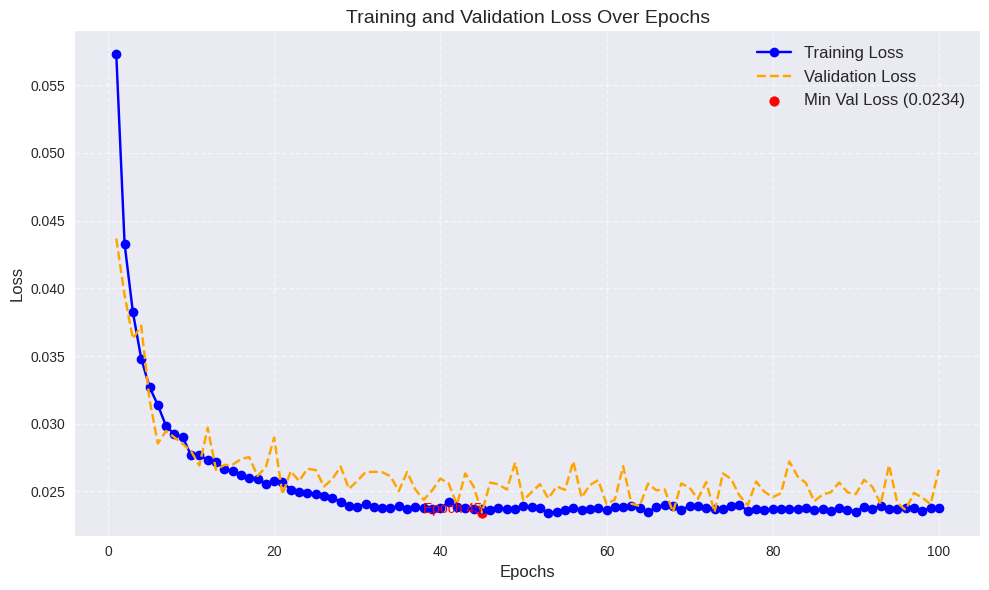

In [112]:
# TODO: Plot training and validation loss over epochs
epochs = range(1, len(train_loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, label='Training Loss', color='blue', linestyle='-', marker='o')
plt.plot(epochs, val_loss, label='Validation Loss', color='orange', linestyle='--', marker='x')

# Highlight minimum validation loss
min_val_loss = min(val_loss)
min_epoch = val_loss.index(min_val_loss) + 1
plt.scatter(min_epoch, min_val_loss, color='red', label=f'Min Val Loss ({min_val_loss:.4f})')
plt.text(min_epoch, min_val_loss, f'Epoch {min_epoch}', fontsize=10, color='red', ha='right')

# Add grid, labels, and title
plt.grid(visible=True, linestyle='--', alpha=0.6)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('Training and Validation Loss Over Epochs', fontsize=14)
plt.legend(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

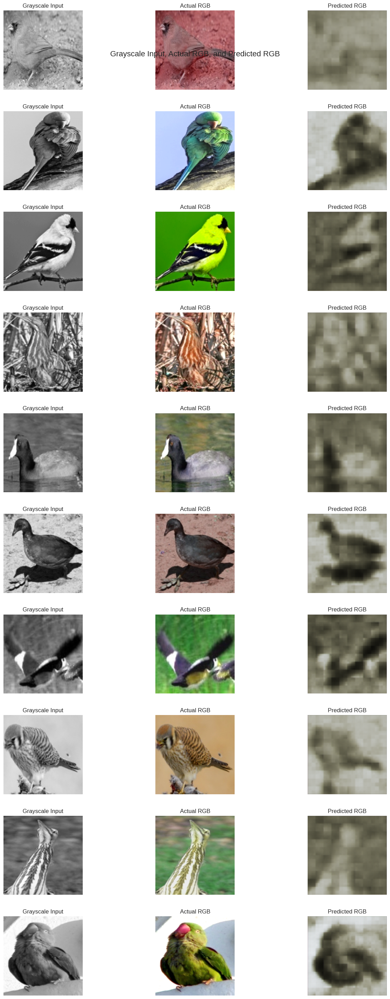

In [113]:
def plot_predictions(test_dataset, model, device, num_samples=10):
    """
    Plots grayscale inputs, actual RGB targets, and predicted RGB outputs with improved visuals.

    Parameters:
    - test_dataset: Dataset containing grayscale inputs and RGB targets.
    - model: Trained model for prediction.
    - device: Device (CPU/GPU) for inference.
    - num_samples: Number of samples to plot (default: 10).
    """
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, num_samples * 3))
    model.eval()

    for i in range(num_samples):
        # Get grayscale input and RGB target
        gray, rgb = test_dataset[i]
        gray = gray.squeeze(0)  # Remove channel dimension for grayscale
        rgb = rgb.permute(1, 2, 0).cpu().numpy()  # Convert to (H, W, C) for RGB

        # Prepare grayscale input for prediction
        gray_input = gray.unsqueeze(0).unsqueeze(0).to(device)  # Add batch and channel dimensions

        # Get prediction
        with torch.no_grad():
            pred, _, _ = model(gray_input)
            pred = pred[0].permute(1, 2, 0).cpu().numpy()  # Convert to (H, W, C) for RGB

        # Clear cache
        torch.cuda.empty_cache()

        # Plot grayscale input
        axes[i, 0].imshow(gray, cmap='gray')
        axes[i, 0].set_title("Grayscale Input", fontsize=12)
        axes[i, 0].axis('off')

        # Plot actual RGB target
        axes[i, 1].imshow(rgb)
        axes[i, 1].set_title("Actual RGB", fontsize=12)
        axes[i, 1].axis('off')

        # Plot predicted RGB
        axes[i, 2].imshow(pred)
        axes[i, 2].set_title("Predicted RGB", fontsize=12)
        axes[i, 2].axis('off')

    # Add overall title and adjust layout
    fig.suptitle("Grayscale Input, Actual RGB, and Predicted RGB", fontsize=16, y=0.92)
    plt.tight_layout(pad=3.0)
    plt.show()

test_dataset = BirdDataset(df_train, transform_input=transform_input, transform_target=transform_target)

plot_predictions(test_dataset, model, device, num_samples=10)


<ipython-input-121-56a08dd20e4c>:58: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], cmap='tab10', s=10, alpha=0.7)


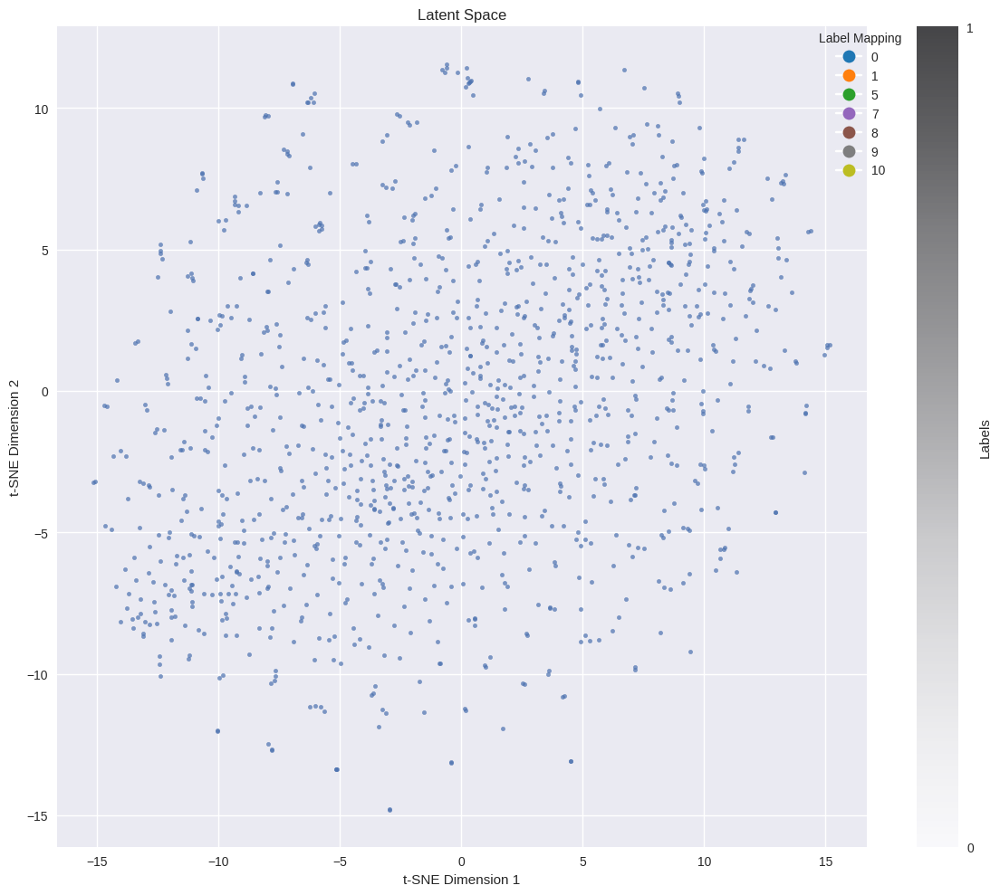

In [121]:
# Visualizing the Latent Space
# Latent space visualizations are a powerful tool to understand how the VAE encodes data.
# In this task, students are required to implement a visualization routine to observe the distribution of their data within the latent space.
# The goal is to project high-dimensional encoded data into two dimensions using t-SNE and inspect how different data points are clustered.
from sklearn.manifold import TSNE


# Function to visualize the latent space
def visualize_latent_space(encoder, data_loader, train_dataset, num_samples=1000):
    """
    Uses a 2-dimensional t-SNE plot to visualize latent space of encoded images.

    Parameters:
    encoder (torch.nn.Module): The encoder model component of the VAE.
    data_loader (torch.utils.data.DataLoader)
    train_dataset (torch.utils.data.Dataset): The dataset containing the labels.
    num_samples (int): Number of samples to visualize
    """
    encoder.eval()
    embeddings = []
    labels = []

    with torch.no_grad():
        for i, (images, targets) in enumerate(data_loader):
            if len(embeddings) >= num_samples:
                break

            device = next(encoder.parameters()).device
            images = images.to(device)
            mu, _ = encoder(images)
            embeddings.append(mu.cpu().numpy())
            labels.append(train_dataset.df.iloc[i, 1])

    embeddings = np.vstack(embeddings)
    unique_labels = list(set(labels))
    label_to_int = {label: idx for idx, label in enumerate(unique_labels)}
    numeric_labels = [label_to_int[label] for label in labels]
    tsne = TSNE(n_components=2, random_state=42)
    tsne_results = tsne.fit_transform(embeddings)

    plt.figure(figsize=(12, 10))
    scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], cmap='tab10', s=10, alpha=0.7)
    plt.colorbar(scatter, ticks=range(len(unique_labels)), label="Labels")
    plt.title("Latent Space")
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")

    legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab10(i / len(unique_labels)), markersize=10, label=label)
                      for i, label in enumerate(unique_labels)]
    plt.legend(handles=legend_handles, title="Label Mapping", loc="best", bbox_to_anchor=(1.05, 1), borderaxespad=0.)
    plt.tight_layout()
    plt.show()

dloader = DataLoader(train_dataset, batch_size=128, shuffle=False)
visualize_latent_space(model.encoder, dloader, train_dataset, num_samples=10)

How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?

    Clusters in the latent space can be visualized using dimensionality reduction techniques like t-SNE or PCA. These clusters often correspond to specific features such as shape, texture, or brightness, which might indirectly relate to color attributes.
    For instance, similar grayscale images with similar features might cluster together, and their proximity could reflect the VAE's encoding of potential color information.


    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?

    If clusters correspond to input features (e.g., edges, texture), the VAE likely learns color mappings based on these features. For example, a cluster of smooth grayscale gradients might correspond to one color palette, while another cluster of high-contrast images might correspond to a different set of colorizations.
    A lack of distinct clusters may indicate that the VAE struggles to generalize or differentiate between features necessary for consistent colorization.


2. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?
    
    **Latent Space Continuity:**By interpolating between neighboring points in the latent space and observing the generated color outputs, we can assess whether the transitions are smooth. For example:
    If slight changes in latent points produce drastically different colors, the representation may lack smoothness.
    Conversely, smooth transitions suggest that the VAE has learned a coherent manifold, leading to more realistic and consistent colorization.

    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?

    Smooth latent representations are particularly important for images with gradual transitions, such as lighting or shading variations. A well-trained VAE should be able to reflect these subtleties in its output, maintaining realism.
    Poor continuity could result in artifacts or unrealistic shifts in color across regions with slight grayscale differences.

3. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?

    **Using t-SNE for Visualization**:t-SNE is effective at capturing local relationships in high-dimensional data and projecting them into a 2D space. This can reveal clusters or neighborhoods in the latent space, which helps in interpreting how the VAE organizes similar inputs.
    However, t-SNE does not preserve global structure well. This means that distances between clusters or broader trends in the latent space might not be accurately represented.

    **Limitations and Interpretation**:Overemphasis on local structures might lead to misleading interpretations of cluster separability.
    Dimensionality reduction might obscure latent variables that are key to colorization (e.g., if t-SNE fails to capture a variable encoding hue differences).
    To mitigate these issues, complement t-SNE with other methods (e.g., PCA, UMAP) or directly analyze the high-dimensional latent space.



Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?

The encoder-decoder architecture in VAEs enables learning complex data distributions by mapping grayscale images to a probabilistic latent space. The encoder extracts key features, while the decoder generates diverse, plausible colorizations by sampling from this latent distribution. Unlike a simple autoencoder, which deterministically compresses and reconstructs data, the VAE regularizes the latent space (via KL divergence) for smoothness and generalization, allowing it to handle uncertainty and produce multiple valid outputs for the same input. This flexibility makes VAEs ideal for colorization tasks, capturing both global structure and local details.

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?

Perceptual loss enhances colorized image quality by comparing high-level features extracted from a pretrained network, focusing on semantic and perceptual similarities rather than exact pixel values. Unlike pixel-wise losses like MSE, which penalize differences at each pixel and can result in blurry outputs, perceptual loss captures structural and contextual information, producing sharper and more realistic colorizations that align with human perception.

Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?

The latent space in a VAE balances fidelity and diversity by encoding image features compactly. A well-structured latent space ensures realistic and varied color outputs. Increasing the dimensionality can improve fidelity by capturing more detail but may reduce generalization, leading to overfitting. Lower dimensionality promotes diversity but risks losing important details, reducing image quality. Proper dimensionality tuning is crucial for optimal performance.

# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [92]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
# import necessary PyTorch libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

print ('modules loaded')

modules loaded


## Load the Dataset

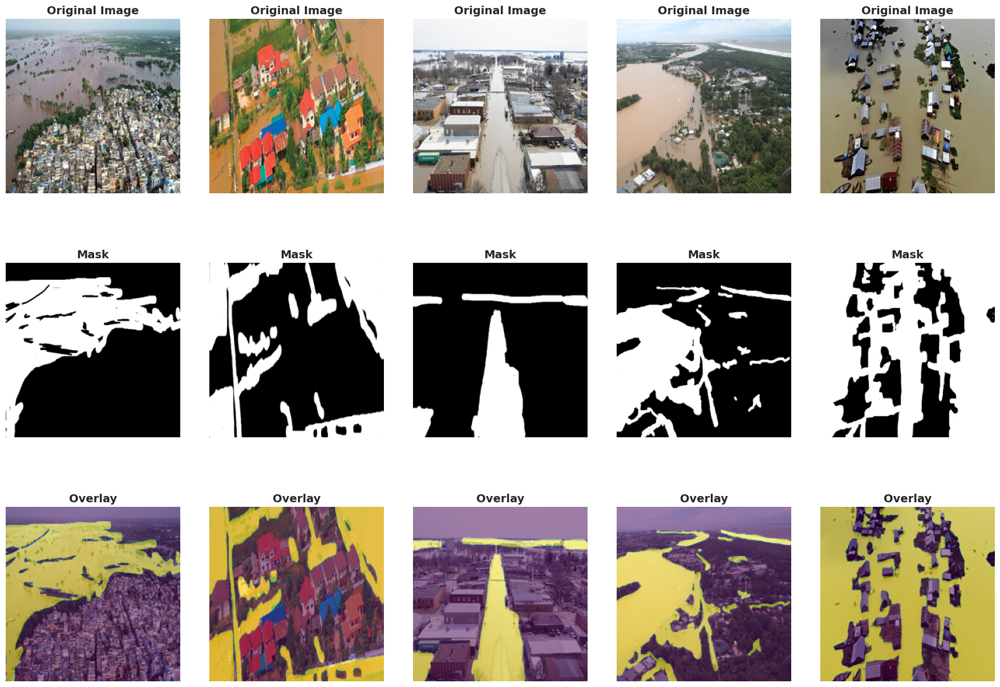

In [93]:
import os
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def create_data(data_dir):
    """
    TODO: Traverse through the given data directory to extract and return paths to images and masks.
    - Identify relevant folders for images and masks.
    - Collect file paths from these folders and return them as lists.
    """
    image_dir = os.path.join(data_dir, "Image")
    mask_dir = os.path.join(data_dir, "Mask")

    # Collect image and mask paths
    image_paths = sorted([os.path.join(image_dir, fname) for fname in os.listdir(image_dir) if fname.endswith(('.png', '.jpg', '.jpeg'))])
    mask_paths = sorted([os.path.join(mask_dir, fname) for fname in os.listdir(mask_dir) if fname.endswith(('.png', '.jpg', '.jpeg'))])

    return image_paths, mask_paths


def load_image(image_path, SIZE):
    """
    TODO: Load and resize an individual image to the specified size, scaling pixel values appropriately.
    - Convert image to array and normalize pixel values.
    - Use resizing techniques to ensure uniform image dimensions.
    """
    img = Image.open(image_path).convert("RGB")
    img = img.resize((SIZE, SIZE))
    img = np.array(img) / 255.0  # Normalize pixel values
    return img


def load_images(image_paths, SIZE, mask=False, trim=None):
    """
    TODO: Batch process a list of image paths, loading and organizing images into a numpy array.
    - Handle both image and mask files optionally, managing different channel dimensions.
    - Optionally trim the list of images to handle a subset of data.
    """
    if trim:
        image_paths = image_paths[:trim]

    processed_images = []
    for path in image_paths:
        img = Image.open(path)
        if mask:
            img = img.convert("L")  # Convert masks to grayscale
        else:
            img = img.convert("RGB")
        img = img.resize((SIZE, SIZE))
        img = np.array(img) / 255.0  # Normalize
        if mask:
            img = np.expand_dims(img, axis=-1)  # Add channel dimension for masks
        processed_images.append(img)

    return np.array(processed_images)


def show_image(image, title=None, cmap=None, alpha=1):
    """
    TODO: Display a single image using matplotlib with options for color map and transparency.
    - Ensure axes are turned off for a cleaner display.
    - Include optional title for context.
    """
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title:
        plt.title(title, fontsize=14)
    plt.axis('off')
    plt.show()


def show_mask(image, mask, cmap=None, alpha=0.4):
    """
    TODO: Overlay a mask on an image to visualize segmentation results.
    - Use transparency to allow both mask and image to be visible.
    - Include color mapping to differentiate mask areas.
    """
    plt.imshow(image)
    plt.imshow(mask.squeeze(), cmap=cmap, alpha=alpha)
    plt.axis('off')
    plt.show()


def show_images(images, masks):
    """
    TODO: Display multiple image-mask pairs to examine the dataset distribution.
    - Randomly select sample pairs of images and masks for visualization.
    - Use subplots to arrange visuals neatly and use tight layout for optimization.
    """
    n_samples = min(len(images), 5)  # Show up to 5 pairs
    sample_indices = random.sample(range(len(images)), n_samples)

    plt.figure(figsize=(18, 12))  # Increased figure size
    for i, idx in enumerate(sample_indices):
        # Show image
        plt.subplot(3, n_samples, i + 1)
        plt.imshow(images[idx])
        plt.axis('off')
        plt.title("Original Image", fontsize=14, weight='bold')

        # Show mask
        plt.subplot(3, n_samples, i + 1 + n_samples)
        plt.imshow(masks[idx].squeeze(), cmap='gray')
        plt.axis('off')
        plt.title("Mask", fontsize=14, weight='bold')

        # Overlay image and mask with transparency
        plt.subplot(3, n_samples, i + 1 + 2 * n_samples)
        plt.imshow(images[idx])
        plt.imshow(masks[idx].squeeze(), cmap='viridis', alpha=0.5)
        plt.axis('off')
        plt.title("Overlay", fontsize=14, weight='bold')

    # Adjust layout to improve spacing between images
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.4)  # Adjust vertical spacing
    plt.show()


SIZE = 256

# TODO: Load and visualize images
data_dir = '/content/drive/MyDrive/data2'
image_paths, mask_paths = create_data(data_dir)

imgs = load_images(image_paths, SIZE)
msks = load_images(mask_paths, SIZE, mask=True)

show_images(imgs, msks)

## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [94]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Dice coefficient loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        pred = pred.contiguous()
        target = target.contiguous()

        intersection = (pred * target).sum(dim=2).sum(dim=2)
        dice_coeff = (2. * intersection + self.smooth) / (pred.sum(dim=2).sum(dim=2) + target.sum(dim=2).sum(dim=2) + self.smooth)

        return 1 - dice_coeff.mean()

class JaccardLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(JaccardLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Jaccard (IoU) loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        pred = pred.contiguous()
        target = target.contiguous()

        intersection = (pred * target).sum(dim=2).sum(dim=2)
        union = pred.sum(dim=2).sum(dim=2) + target.sum(dim=2).sum(dim=2) - intersection

        iou = (intersection + self.smooth) / (union + self.smooth)

        return 1 - iou.mean()


class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        """
        Initialize the DoubleConv module.

        Args:
            in_channels (int): Number of input channels.
            out_channels (int): Number of output channels.
        """
        super(DoubleConv, self).__init__()
        # Define a double convolutional layer with batch normalization and ReLU activation
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, stride=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, stride=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        """
        Forward pass for DoubleConv.

        Args:
            x (torch.Tensor): Input tensor of shape (batch_size, in_channels, height, width).

        Returns:
            torch.Tensor: Output tensor of shape (batch_size, out_channels, height, width).
        """
        return self.conv(x)


class UpConvBlock(nn.Module):
    def __init__(self, in_channel, out_channel):
      super().__init__()
      self.upconv = nn.Sequential(
          nn.Upsample(scale_factor=2),
          nn.Conv2d(in_channel, out_channel, kernel_size=3, stride=1, padding=1, bias=True),
          nn.BatchNorm2d(out_channel),
          nn.ReLU(True)
      )

    def forward(self, x):
      return self.upconv(x)


class AttentionBlock(nn.Module):
    def __init__(self, f_g, f_l, f_int):
      super().__init__()

      self.w_g = nn.Sequential(
          nn.Conv2d(f_g, f_int, kernel_size=1, stride=1, padding=0, bias=True),
          nn.BatchNorm2d(f_int)
      )

      self.w_x = nn.Sequential(
          nn.Conv2d(f_l, f_int, kernel_size=1, stride=1, padding=0, bias=True),
          nn.BatchNorm2d(f_int)
      )

      self.psi = nn.Sequential(
          nn.Conv2d(f_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
          nn.BatchNorm2d(1),
          nn.Sigmoid()
      )

      self.act = nn.ReLU(True)


    def forward(self, g, x):
      g1 = self.w_g(g)
      x1 = self.w_x(x)
      p = self.act(g1+x1)
      p = self.psi(p)

      return p * x

class UNet(nn.Module):
    def __init__(self, in_channel=3, out_channel=1):
        super().__init__()
        self.mp = nn.MaxPool2d(kernel_size=2, stride=2)
        self.feature_sizes = [64, 128, 256, 512]
        self.conv_blocks = nn.ModuleList([
            DoubleConv(in_channel, self.feature_sizes[0]),
            DoubleConv(self.feature_sizes[0], self.feature_sizes[1]),
            DoubleConv(self.feature_sizes[1], self.feature_sizes[2]),
            DoubleConv(self.feature_sizes[2], self.feature_sizes[3])
        ])
        self.upconv_blocks = nn.ModuleList([
            UpConvBlock(self.feature_sizes[3], self.feature_sizes[2]),
            UpConvBlock(self.feature_sizes[2], self.feature_sizes[1]),
            UpConvBlock(self.feature_sizes[1], self.feature_sizes[0])
        ])
        self.att_blocks = nn.ModuleList([
            AttentionBlock(self.feature_sizes[2], self.feature_sizes[2], self.feature_sizes[1]),
            AttentionBlock(self.feature_sizes[1], self.feature_sizes[1], self.feature_sizes[0]),
            AttentionBlock(self.feature_sizes[0], self.feature_sizes[0], 32)
        ])
        self.upconv_final_blocks = nn.ModuleList([
            DoubleConv(self.feature_sizes[3], self.feature_sizes[2]),
            DoubleConv(self.feature_sizes[2], self.feature_sizes[1]),
            DoubleConv(self.feature_sizes[1], self.feature_sizes[0])
        ])

        self.last_conv = nn.Sequential(
            nn.Conv2d(self.feature_sizes[0], out_channel, kernel_size=1, stride=1, padding=0),
            nn.Sigmoid()
        )

        self.dice = DiceLoss()
        self.jac = JaccardLoss()

    def forward(self, x):
        skips = []
        for i, conv_block in enumerate(self.conv_blocks):
            x = conv_block(x)
            if i < len(self.conv_blocks) - 1:
                skips.append(x)
                x = self.mp(x)
        for i, (upconv_block, att_block, upconv_final_block) in enumerate(zip(self.upconv_blocks, self.att_blocks, self.upconv_final_blocks)):
            x = upconv_block(x)
            x = att_block(x, skips[-(i + 1)])
            x = torch.cat((x, skips[-(i + 1)]), dim=1)
            x = upconv_final_block(x)
        output = self.last_conv(x)

        return output

    def compute_loss(self, pred, real):
        return self.dice(pred, real) + self.jac(pred, real)

    def compute_accuracy(self, pred, real):
        pred = (pred > 0.5).float()
        correct = (pred == real).float()
        accuracy = correct.sum() / correct.numel()
        return accuracy

model = UNet().to(device)

## Training

In [95]:
class SegmentationDataset(Dataset):
    def __init__(self, images, masks):
        """
        Initializes the dataset with images and corresponding masks.
        Args:
            images (list or np.array): List of input images.
            masks (list or np.array): List of corresponding masks for segmentation.
        """
        self.images = images
        self.masks = masks

    def __len__(self):
        """
        Returns the total number of samples in the dataset.
        """
        return len(self.images)

    def __getitem__(self, idx):
        """
        Returns a single image and its corresponding mask, converted to tensor.
        Args:
            idx (int): Index of the sample to retrieve.
        """
        image = self.images[idx]
        mask = self.masks[idx]
        return torch.tensor(image, dtype=torch.float32).permute(2, 0, 1), torch.tensor(mask, dtype=torch.float32).permute(2, 0, 1)

def train_model(model, train_loader, optimizer, criterion, device, epoch, total_epochs):
    """
    Trains the model for one epoch.
    Args:
        model (nn.Module): The model to train.
        train_loader (DataLoader): The training dataset loader.
        optimizer (torch.optim.Optimizer): Optimizer for model parameters.
        criterion (function): Loss function.
        device (torch.device): Device to run the model (GPU/CPU).
        epoch (int): Current epoch number.
        total_epochs (int): Total number of epochs.
    """
    model.train()
    running_loss = 0.0
    running_accuracy = 0.0

    for batch_idx, (images, masks) in enumerate(tqdm(train_loader, desc=f"Training Epoch {epoch}/{total_epochs}")):
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        running_accuracy += model.compute_accuracy(outputs, masks).item()

    avg_loss = running_loss / len(train_loader)
    avg_accuracy = running_accuracy / len(train_loader)
    print(f"Epoch {epoch}/{total_epochs} - Loss: {avg_loss:.4f}, Accuracy: {avg_accuracy:.4f}")

    return avg_loss, avg_accuracy


def validate_model(model, val_loader, criterion, device):
    """
    Validates the model on the validation set.
    Args:
        model (nn.Module): The model to validate.
        val_loader (DataLoader): The validation dataset loader.
        criterion (function): Loss function.
        device (torch.device): Device to run the model (GPU/CPU).
    """
    model.eval()
    running_loss = 0.0
    running_accuracy = 0.0

    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)
            running_loss += loss.item()
            running_accuracy += model.compute_accuracy(outputs, masks).item()

    avg_val_loss = running_loss / len(val_loader)
    avg_val_accuracy = running_accuracy / len(val_loader)
    print(f"Validation - Loss: {avg_val_loss:.4f}, Accuracy: {avg_val_accuracy:.4f}")

    return avg_val_loss, avg_val_accuracy


BATCH_SIZE = 16
TOTAL_EPOCHS = 100
LEARNING_RATE = 1e-4

dataset = SegmentationDataset(imgs, msks)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
criterion = model.compute_loss


In [96]:
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []


for epoch in range(1, TOTAL_EPOCHS + 1):
    print(f"\nStarting Epoch {epoch}/{TOTAL_EPOCHS}...")

    train_loss, train_accuracy = train_model(model, train_loader, optimizer, criterion, device, epoch, TOTAL_EPOCHS)
    val_loss, val_accuracy = validate_model(model, val_loader, criterion, device)
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)



    print(f"End of Epoch {epoch}/{TOTAL_EPOCHS}.")


Starting Epoch 1/100...


Training Epoch 1/100: 100%|██████████| 15/15 [00:12<00:00,  1.18it/s]


Epoch 1/100 - Loss: 1.0849, Accuracy: 0.7003
Validation - Loss: 1.1769, Accuracy: 0.3990
End of Epoch 1/100.

Starting Epoch 2/100...


Training Epoch 2/100: 100%|██████████| 15/15 [00:12<00:00,  1.18it/s]


Epoch 2/100 - Loss: 0.8956, Accuracy: 0.7547
Validation - Loss: 0.9875, Accuracy: 0.4885
End of Epoch 2/100.

Starting Epoch 3/100...


Training Epoch 3/100: 100%|██████████| 15/15 [00:12<00:00,  1.17it/s]


Epoch 3/100 - Loss: 0.8389, Accuracy: 0.7751
Validation - Loss: 0.8752, Accuracy: 0.6370
End of Epoch 3/100.

Starting Epoch 4/100...


Training Epoch 4/100: 100%|██████████| 15/15 [00:12<00:00,  1.16it/s]


Epoch 4/100 - Loss: 0.7923, Accuracy: 0.8010
Validation - Loss: 0.7640, Accuracy: 0.7618
End of Epoch 4/100.

Starting Epoch 5/100...


Training Epoch 5/100: 100%|██████████| 15/15 [00:13<00:00,  1.15it/s]


Epoch 5/100 - Loss: 0.7567, Accuracy: 0.8117
Validation - Loss: 0.7143, Accuracy: 0.8369
End of Epoch 5/100.

Starting Epoch 6/100...


Training Epoch 6/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 6/100 - Loss: 0.7554, Accuracy: 0.8057
Validation - Loss: 0.6779, Accuracy: 0.8142
End of Epoch 6/100.

Starting Epoch 7/100...


Training Epoch 7/100: 100%|██████████| 15/15 [00:13<00:00,  1.12it/s]


Epoch 7/100 - Loss: 0.7306, Accuracy: 0.8169
Validation - Loss: 0.6718, Accuracy: 0.8345
End of Epoch 7/100.

Starting Epoch 8/100...


Training Epoch 8/100: 100%|██████████| 15/15 [00:13<00:00,  1.12it/s]


Epoch 8/100 - Loss: 0.7025, Accuracy: 0.8282
Validation - Loss: 0.6229, Accuracy: 0.8378
End of Epoch 8/100.

Starting Epoch 9/100...


Training Epoch 9/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 9/100 - Loss: 0.6930, Accuracy: 0.8246
Validation - Loss: 0.6494, Accuracy: 0.8362
End of Epoch 9/100.

Starting Epoch 10/100...


Training Epoch 10/100: 100%|██████████| 15/15 [00:13<00:00,  1.11it/s]


Epoch 10/100 - Loss: 0.6684, Accuracy: 0.8323
Validation - Loss: 0.6580, Accuracy: 0.8505
End of Epoch 10/100.

Starting Epoch 11/100...


Training Epoch 11/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 11/100 - Loss: 0.6692, Accuracy: 0.8297
Validation - Loss: 0.6332, Accuracy: 0.8557
End of Epoch 11/100.

Starting Epoch 12/100...


Training Epoch 12/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 12/100 - Loss: 0.6559, Accuracy: 0.8296
Validation - Loss: 0.5640, Accuracy: 0.8597
End of Epoch 12/100.

Starting Epoch 13/100...


Training Epoch 13/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 13/100 - Loss: 0.6310, Accuracy: 0.8379
Validation - Loss: 0.6336, Accuracy: 0.8309
End of Epoch 13/100.

Starting Epoch 14/100...


Training Epoch 14/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 14/100 - Loss: 0.6244, Accuracy: 0.8407
Validation - Loss: 0.5489, Accuracy: 0.8652
End of Epoch 14/100.

Starting Epoch 15/100...


Training Epoch 15/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 15/100 - Loss: 0.6049, Accuracy: 0.8478
Validation - Loss: 0.5843, Accuracy: 0.8672
End of Epoch 15/100.

Starting Epoch 16/100...


Training Epoch 16/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 16/100 - Loss: 0.6029, Accuracy: 0.8433
Validation - Loss: 0.6035, Accuracy: 0.8276
End of Epoch 16/100.

Starting Epoch 17/100...


Training Epoch 17/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 17/100 - Loss: 0.5961, Accuracy: 0.8458
Validation - Loss: 0.5304, Accuracy: 0.8702
End of Epoch 17/100.

Starting Epoch 18/100...


Training Epoch 18/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 18/100 - Loss: 0.5732, Accuracy: 0.8521
Validation - Loss: 0.5598, Accuracy: 0.8620
End of Epoch 18/100.

Starting Epoch 19/100...


Training Epoch 19/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 19/100 - Loss: 0.5906, Accuracy: 0.8365
Validation - Loss: 0.5287, Accuracy: 0.8599
End of Epoch 19/100.

Starting Epoch 20/100...


Training Epoch 20/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 20/100 - Loss: 0.5764, Accuracy: 0.8484
Validation - Loss: 0.5354, Accuracy: 0.8674
End of Epoch 20/100.

Starting Epoch 21/100...


Training Epoch 21/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 21/100 - Loss: 0.5547, Accuracy: 0.8567
Validation - Loss: 0.5020, Accuracy: 0.8755
End of Epoch 21/100.

Starting Epoch 22/100...


Training Epoch 22/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 22/100 - Loss: 0.5610, Accuracy: 0.8521
Validation - Loss: 0.4874, Accuracy: 0.8749
End of Epoch 22/100.

Starting Epoch 23/100...


Training Epoch 23/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 23/100 - Loss: 0.5378, Accuracy: 0.8604
Validation - Loss: 0.4891, Accuracy: 0.8800
End of Epoch 23/100.

Starting Epoch 24/100...


Training Epoch 24/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 24/100 - Loss: 0.5263, Accuracy: 0.8624
Validation - Loss: 0.5448, Accuracy: 0.8387
End of Epoch 24/100.

Starting Epoch 25/100...


Training Epoch 25/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 25/100 - Loss: 0.5423, Accuracy: 0.8530
Validation - Loss: 0.5177, Accuracy: 0.8585
End of Epoch 25/100.

Starting Epoch 26/100...


Training Epoch 26/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 26/100 - Loss: 0.5217, Accuracy: 0.8566
Validation - Loss: 0.4606, Accuracy: 0.8729
End of Epoch 26/100.

Starting Epoch 27/100...


Training Epoch 27/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 27/100 - Loss: 0.5051, Accuracy: 0.8651
Validation - Loss: 0.4909, Accuracy: 0.8712
End of Epoch 27/100.

Starting Epoch 28/100...


Training Epoch 28/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 28/100 - Loss: 0.4888, Accuracy: 0.8675
Validation - Loss: 0.4807, Accuracy: 0.8651
End of Epoch 28/100.

Starting Epoch 29/100...


Training Epoch 29/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 29/100 - Loss: 0.4885, Accuracy: 0.8688
Validation - Loss: 0.4774, Accuracy: 0.8661
End of Epoch 29/100.

Starting Epoch 30/100...


Training Epoch 30/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 30/100 - Loss: 0.4796, Accuracy: 0.8700
Validation - Loss: 0.4950, Accuracy: 0.8537
End of Epoch 30/100.

Starting Epoch 31/100...


Training Epoch 31/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 31/100 - Loss: 0.4665, Accuracy: 0.8724
Validation - Loss: 0.4824, Accuracy: 0.8774
End of Epoch 31/100.

Starting Epoch 32/100...


Training Epoch 32/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 32/100 - Loss: 0.4532, Accuracy: 0.8755
Validation - Loss: 0.4395, Accuracy: 0.8831
End of Epoch 32/100.

Starting Epoch 33/100...


Training Epoch 33/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 33/100 - Loss: 0.4485, Accuracy: 0.8777
Validation - Loss: 0.4550, Accuracy: 0.8794
End of Epoch 33/100.

Starting Epoch 34/100...


Training Epoch 34/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 34/100 - Loss: 0.4503, Accuracy: 0.8756
Validation - Loss: 0.4263, Accuracy: 0.8795
End of Epoch 34/100.

Starting Epoch 35/100...


Training Epoch 35/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 35/100 - Loss: 0.4520, Accuracy: 0.8771
Validation - Loss: 0.4462, Accuracy: 0.8845
End of Epoch 35/100.

Starting Epoch 36/100...


Training Epoch 36/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 36/100 - Loss: 0.4316, Accuracy: 0.8797
Validation - Loss: 0.4872, Accuracy: 0.8771
End of Epoch 36/100.

Starting Epoch 37/100...


Training Epoch 37/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 37/100 - Loss: 0.4219, Accuracy: 0.8824
Validation - Loss: 0.4418, Accuracy: 0.8785
End of Epoch 37/100.

Starting Epoch 38/100...


Training Epoch 38/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 38/100 - Loss: 0.4332, Accuracy: 0.8760
Validation - Loss: 0.4310, Accuracy: 0.8766
End of Epoch 38/100.

Starting Epoch 39/100...


Training Epoch 39/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 39/100 - Loss: 0.4081, Accuracy: 0.8826
Validation - Loss: 0.4266, Accuracy: 0.8755
End of Epoch 39/100.

Starting Epoch 40/100...


Training Epoch 40/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 40/100 - Loss: 0.3967, Accuracy: 0.8864
Validation - Loss: 0.4687, Accuracy: 0.8716
End of Epoch 40/100.

Starting Epoch 41/100...


Training Epoch 41/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 41/100 - Loss: 0.4155, Accuracy: 0.8798
Validation - Loss: 0.4119, Accuracy: 0.8774
End of Epoch 41/100.

Starting Epoch 42/100...


Training Epoch 42/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 42/100 - Loss: 0.4073, Accuracy: 0.8822
Validation - Loss: 0.4323, Accuracy: 0.8767
End of Epoch 42/100.

Starting Epoch 43/100...


Training Epoch 43/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 43/100 - Loss: 0.3776, Accuracy: 0.8904
Validation - Loss: 0.4211, Accuracy: 0.8854
End of Epoch 43/100.

Starting Epoch 44/100...


Training Epoch 44/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 44/100 - Loss: 0.4032, Accuracy: 0.8830
Validation - Loss: 0.4217, Accuracy: 0.8775
End of Epoch 44/100.

Starting Epoch 45/100...


Training Epoch 45/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 45/100 - Loss: 0.3955, Accuracy: 0.8854
Validation - Loss: 0.4164, Accuracy: 0.8809
End of Epoch 45/100.

Starting Epoch 46/100...


Training Epoch 46/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 46/100 - Loss: 0.3942, Accuracy: 0.8840
Validation - Loss: 0.4422, Accuracy: 0.8722
End of Epoch 46/100.

Starting Epoch 47/100...


Training Epoch 47/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 47/100 - Loss: 0.4070, Accuracy: 0.8798
Validation - Loss: 0.4035, Accuracy: 0.8820
End of Epoch 47/100.

Starting Epoch 48/100...


Training Epoch 48/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 48/100 - Loss: 0.3867, Accuracy: 0.8849
Validation - Loss: 0.4073, Accuracy: 0.8815
End of Epoch 48/100.

Starting Epoch 49/100...


Training Epoch 49/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 49/100 - Loss: 0.3826, Accuracy: 0.8863
Validation - Loss: 0.4240, Accuracy: 0.8707
End of Epoch 49/100.

Starting Epoch 50/100...


Training Epoch 50/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 50/100 - Loss: 0.4165, Accuracy: 0.8735
Validation - Loss: 0.4600, Accuracy: 0.8780
End of Epoch 50/100.

Starting Epoch 51/100...


Training Epoch 51/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 51/100 - Loss: 0.3692, Accuracy: 0.8867
Validation - Loss: 0.3873, Accuracy: 0.8889
End of Epoch 51/100.

Starting Epoch 52/100...


Training Epoch 52/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 52/100 - Loss: 0.3621, Accuracy: 0.8918
Validation - Loss: 0.4119, Accuracy: 0.8853
End of Epoch 52/100.

Starting Epoch 53/100...


Training Epoch 53/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 53/100 - Loss: 0.3557, Accuracy: 0.8919
Validation - Loss: 0.4023, Accuracy: 0.8848
End of Epoch 53/100.

Starting Epoch 54/100...


Training Epoch 54/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 54/100 - Loss: 0.3519, Accuracy: 0.8923
Validation - Loss: 0.3945, Accuracy: 0.8878
End of Epoch 54/100.

Starting Epoch 55/100...


Training Epoch 55/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 55/100 - Loss: 0.3289, Accuracy: 0.8988
Validation - Loss: 0.3963, Accuracy: 0.8811
End of Epoch 55/100.

Starting Epoch 56/100...


Training Epoch 56/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 56/100 - Loss: 0.3295, Accuracy: 0.8974
Validation - Loss: 0.3874, Accuracy: 0.8849
End of Epoch 56/100.

Starting Epoch 57/100...


Training Epoch 57/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 57/100 - Loss: 0.3281, Accuracy: 0.8979
Validation - Loss: 0.3935, Accuracy: 0.8854
End of Epoch 57/100.

Starting Epoch 58/100...


Training Epoch 58/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 58/100 - Loss: 0.3216, Accuracy: 0.8994
Validation - Loss: 0.3857, Accuracy: 0.8881
End of Epoch 58/100.

Starting Epoch 59/100...


Training Epoch 59/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 59/100 - Loss: 0.3295, Accuracy: 0.8973
Validation - Loss: 0.3643, Accuracy: 0.8925
End of Epoch 59/100.

Starting Epoch 60/100...


Training Epoch 60/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 60/100 - Loss: 0.3101, Accuracy: 0.9018
Validation - Loss: 0.3824, Accuracy: 0.8880
End of Epoch 60/100.

Starting Epoch 61/100...


Training Epoch 61/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 61/100 - Loss: 0.3155, Accuracy: 0.9004
Validation - Loss: 0.4203, Accuracy: 0.8690
End of Epoch 61/100.

Starting Epoch 62/100...


Training Epoch 62/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 62/100 - Loss: 0.3334, Accuracy: 0.8950
Validation - Loss: 0.4716, Accuracy: 0.8712
End of Epoch 62/100.

Starting Epoch 63/100...


Training Epoch 63/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 63/100 - Loss: 0.3147, Accuracy: 0.9004
Validation - Loss: 0.3692, Accuracy: 0.8897
End of Epoch 63/100.

Starting Epoch 64/100...


Training Epoch 64/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 64/100 - Loss: 0.3001, Accuracy: 0.9039
Validation - Loss: 0.3785, Accuracy: 0.8848
End of Epoch 64/100.

Starting Epoch 65/100...


Training Epoch 65/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 65/100 - Loss: 0.3024, Accuracy: 0.9029
Validation - Loss: 0.3874, Accuracy: 0.8766
End of Epoch 65/100.

Starting Epoch 66/100...


Training Epoch 66/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 66/100 - Loss: 0.2925, Accuracy: 0.9061
Validation - Loss: 0.3764, Accuracy: 0.8842
End of Epoch 66/100.

Starting Epoch 67/100...


Training Epoch 67/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 67/100 - Loss: 0.2885, Accuracy: 0.9069
Validation - Loss: 0.3900, Accuracy: 0.8798
End of Epoch 67/100.

Starting Epoch 68/100...


Training Epoch 68/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 68/100 - Loss: 0.2965, Accuracy: 0.9045
Validation - Loss: 0.3789, Accuracy: 0.8892
End of Epoch 68/100.

Starting Epoch 69/100...


Training Epoch 69/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 69/100 - Loss: 0.2947, Accuracy: 0.9041
Validation - Loss: 0.3775, Accuracy: 0.8825
End of Epoch 69/100.

Starting Epoch 70/100...


Training Epoch 70/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 70/100 - Loss: 0.2847, Accuracy: 0.9066
Validation - Loss: 0.3712, Accuracy: 0.8911
End of Epoch 70/100.

Starting Epoch 71/100...


Training Epoch 71/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 71/100 - Loss: 0.2798, Accuracy: 0.9078
Validation - Loss: 0.4147, Accuracy: 0.8650
End of Epoch 71/100.

Starting Epoch 72/100...


Training Epoch 72/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 72/100 - Loss: 0.2727, Accuracy: 0.9095
Validation - Loss: 0.3615, Accuracy: 0.8877
End of Epoch 72/100.

Starting Epoch 73/100...


Training Epoch 73/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 73/100 - Loss: 0.2659, Accuracy: 0.9117
Validation - Loss: 0.3826, Accuracy: 0.8856
End of Epoch 73/100.

Starting Epoch 74/100...


Training Epoch 74/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 74/100 - Loss: 0.2810, Accuracy: 0.9056
Validation - Loss: 0.3534, Accuracy: 0.8933
End of Epoch 74/100.

Starting Epoch 75/100...


Training Epoch 75/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 75/100 - Loss: 0.2658, Accuracy: 0.9124
Validation - Loss: 0.3634, Accuracy: 0.8922
End of Epoch 75/100.

Starting Epoch 76/100...


Training Epoch 76/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 76/100 - Loss: 0.2591, Accuracy: 0.9117
Validation - Loss: 0.3725, Accuracy: 0.8912
End of Epoch 76/100.

Starting Epoch 77/100...


Training Epoch 77/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 77/100 - Loss: 0.2622, Accuracy: 0.9119
Validation - Loss: 0.4872, Accuracy: 0.8313
End of Epoch 77/100.

Starting Epoch 78/100...


Training Epoch 78/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 78/100 - Loss: 0.2620, Accuracy: 0.9099
Validation - Loss: 0.3737, Accuracy: 0.8884
End of Epoch 78/100.

Starting Epoch 79/100...


Training Epoch 79/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 79/100 - Loss: 0.2504, Accuracy: 0.9143
Validation - Loss: 0.3689, Accuracy: 0.8850
End of Epoch 79/100.

Starting Epoch 80/100...


Training Epoch 80/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 80/100 - Loss: 0.2527, Accuracy: 0.9134
Validation - Loss: 0.3745, Accuracy: 0.8890
End of Epoch 80/100.

Starting Epoch 81/100...


Training Epoch 81/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 81/100 - Loss: 0.2445, Accuracy: 0.9150
Validation - Loss: 0.3711, Accuracy: 0.8842
End of Epoch 81/100.

Starting Epoch 82/100...


Training Epoch 82/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 82/100 - Loss: 0.2423, Accuracy: 0.9152
Validation - Loss: 0.3692, Accuracy: 0.8886
End of Epoch 82/100.

Starting Epoch 83/100...


Training Epoch 83/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 83/100 - Loss: 0.2550, Accuracy: 0.9130
Validation - Loss: 0.3613, Accuracy: 0.8900
End of Epoch 83/100.

Starting Epoch 84/100...


Training Epoch 84/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 84/100 - Loss: 0.2529, Accuracy: 0.9115
Validation - Loss: 0.4020, Accuracy: 0.8843
End of Epoch 84/100.

Starting Epoch 85/100...


Training Epoch 85/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 85/100 - Loss: 0.2508, Accuracy: 0.9119
Validation - Loss: 0.4225, Accuracy: 0.8748
End of Epoch 85/100.

Starting Epoch 86/100...


Training Epoch 86/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 86/100 - Loss: 0.2510, Accuracy: 0.9137
Validation - Loss: 0.3734, Accuracy: 0.8862
End of Epoch 86/100.

Starting Epoch 87/100...


Training Epoch 87/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 87/100 - Loss: 0.2410, Accuracy: 0.9166
Validation - Loss: 0.3607, Accuracy: 0.8884
End of Epoch 87/100.

Starting Epoch 88/100...


Training Epoch 88/100: 100%|██████████| 15/15 [00:13<00:00,  1.12it/s]


Epoch 88/100 - Loss: 0.2409, Accuracy: 0.9162
Validation - Loss: 0.3672, Accuracy: 0.8884
End of Epoch 88/100.

Starting Epoch 89/100...


Training Epoch 89/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 89/100 - Loss: 0.2315, Accuracy: 0.9181
Validation - Loss: 0.3576, Accuracy: 0.8896
End of Epoch 89/100.

Starting Epoch 90/100...


Training Epoch 90/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 90/100 - Loss: 0.2302, Accuracy: 0.9190
Validation - Loss: 0.3550, Accuracy: 0.8900
End of Epoch 90/100.

Starting Epoch 91/100...


Training Epoch 91/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 91/100 - Loss: 0.2165, Accuracy: 0.9213
Validation - Loss: 0.3525, Accuracy: 0.8905
End of Epoch 91/100.

Starting Epoch 92/100...


Training Epoch 92/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 92/100 - Loss: 0.2176, Accuracy: 0.9216
Validation - Loss: 0.3699, Accuracy: 0.8831
End of Epoch 92/100.

Starting Epoch 93/100...


Training Epoch 93/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 93/100 - Loss: 0.2266, Accuracy: 0.9185
Validation - Loss: 0.3815, Accuracy: 0.8783
End of Epoch 93/100.

Starting Epoch 94/100...


Training Epoch 94/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 94/100 - Loss: 0.2308, Accuracy: 0.9164
Validation - Loss: 0.3643, Accuracy: 0.8891
End of Epoch 94/100.

Starting Epoch 95/100...


Training Epoch 95/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 95/100 - Loss: 0.2217, Accuracy: 0.9202
Validation - Loss: 0.3447, Accuracy: 0.8927
End of Epoch 95/100.

Starting Epoch 96/100...


Training Epoch 96/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 96/100 - Loss: 0.2122, Accuracy: 0.9220
Validation - Loss: 0.3593, Accuracy: 0.8863
End of Epoch 96/100.

Starting Epoch 97/100...


Training Epoch 97/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 97/100 - Loss: 0.2174, Accuracy: 0.9199
Validation - Loss: 0.3518, Accuracy: 0.8890
End of Epoch 97/100.

Starting Epoch 98/100...


Training Epoch 98/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 98/100 - Loss: 0.2151, Accuracy: 0.9211
Validation - Loss: 0.3590, Accuracy: 0.8853
End of Epoch 98/100.

Starting Epoch 99/100...


Training Epoch 99/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 99/100 - Loss: 0.2011, Accuracy: 0.9245
Validation - Loss: 0.3660, Accuracy: 0.8854
End of Epoch 99/100.

Starting Epoch 100/100...


Training Epoch 100/100: 100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Epoch 100/100 - Loss: 0.2046, Accuracy: 0.9223
Validation - Loss: 0.3540, Accuracy: 0.8898
End of Epoch 100/100.


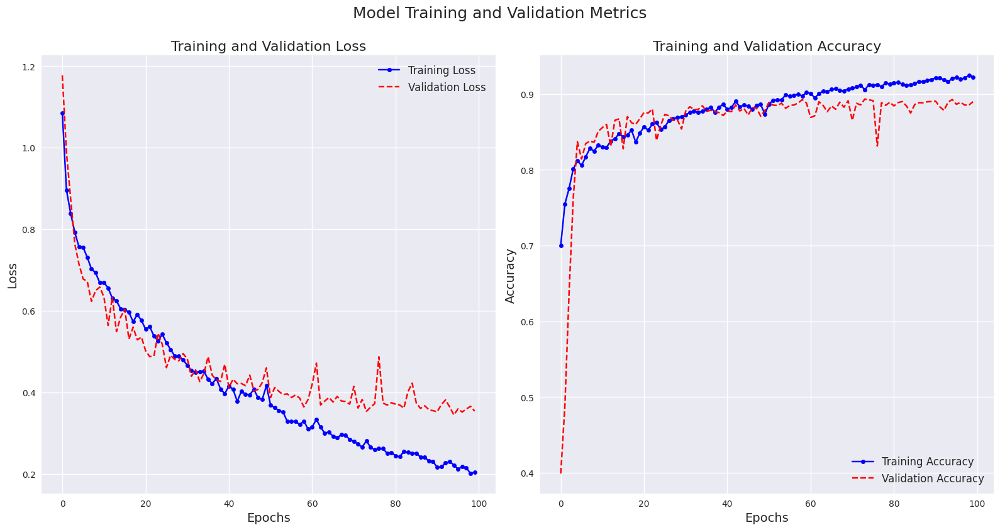

In [97]:
# TODO: Plot training and validation losses and accuracies
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].set_title("Training and Validation Loss", fontsize=16)
axes[0].plot(train_losses, label="Training Loss", color="blue", linestyle='-', marker='o', markersize=5)
axes[0].plot(val_losses, label="Validation Loss", color="red", linestyle='--', marker='x', markersize=5)
axes[0].set_xlabel("Epochs", fontsize=14)
axes[0].set_ylabel("Loss", fontsize=14)
axes[0].legend(loc="upper right", fontsize=12)
axes[0].grid(True)

# Plotting Accuracies
axes[1].set_title("Training and Validation Accuracy", fontsize=16)
axes[1].plot(train_accuracies, label="Training Accuracy", color="blue", linestyle='-', marker='o', markersize=5)
axes[1].plot(val_accuracies, label="Validation Accuracy", color="red", linestyle='--', marker='x', markersize=5)
axes[1].set_xlabel("Epochs", fontsize=14)
axes[1].set_ylabel("Accuracy", fontsize=14)
axes[1].legend(loc="lower right", fontsize=12)
axes[1].grid(True)

# Adjust layout and show
plt.tight_layout()
plt.suptitle("Model Training and Validation Metrics", fontsize=18, y=1.05)
plt.show()

## Plottings

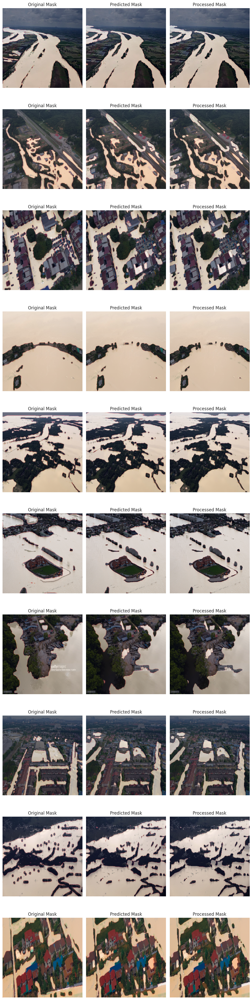

In [98]:
fig, axes = plt.subplots(10, 3, figsize=(10, 40))
axes = axes.flatten()

for i in range(10):
  img = val_dataset[i][0].permute(1, 2, 0)
  msk = val_dataset[i][1].squeeze()
  axes[3 * i].set_title("Original Mask")
  axes[3 * i].imshow(img)
  axes[3 * i].imshow(msk, alpha=0.5)
  axes[3 * i].axis('off')

  axes[3 * i + 1].set_title("Predicted Mask")
  input_image = val_dataset[i][0][None, ...].to(device)
  pred = model(input_image)
  pred = pred.detach().cpu().squeeze().numpy()
  axes[3 * i + 1].imshow(img)
  axes[3 * i + 1].imshow(pred, alpha=0.5)
  axes[3 * i + 1].axis('off')

  axes[3 * i + 2].set_title("Processed Mask")
  bin_pred = (pred >= 0.5).astype(np.uint8)
  axes[3 * i + 2].imshow(img)
  axes[3 * i + 2].imshow(bin_pred, alpha=0.5)
  axes[3 * i + 2].axis('off')

plt.tight_layout()
plt.show()

1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?
    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?

    Dice and Jaccard Losses focus on overlap and are less sensitive to class imbalances compared to Cross-Entropy or Mean Squared Error.
    They excel in capturing spatial overlap, directly optimizing for segmentation quality


2. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.

    Low loss indicates good model performance with high overlap between predictions and ground truth.
    High loss suggests poor segmentation or misalignment, requiring adjustments to the model or data.

Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?

The attention mechanism enhances segmentation accuracy in cluttered environments by allowing the model to focus on relevant features and ignore distractions. It refines the process by weighting important regions more heavily, improving the model's ability to distinguish between foreground and background, leading to better segmentation of complex scenes.

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?


Skip connections in U-Net allow the network to retain fine-grained details from earlier layers and combine them with deeper, more abstract features. This helps preserve spatial information, improving the accuracy of segmentation tasks, especially in cases with complex structures or fine boundaries.

Explain the difference between the predicted and processed mask above.
تصاویر predicted
گاهی نقاطی قرمز و پراکنگی رنگ مشاهده می شود
